# N-gramas y Colocaciones del lenguaje

In [1]:
import nltk
nltk.download("book")
from nltk.book import *
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px

[nltk_data] Downloading collection 'book'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to
[nltk_data]    |     /Users/macbookair/nltk_data...
[nltk_data]    |   Package abc is already up-to-date!
[nltk_data]    | Downloading package brown to
[nltk_data]    |     /Users/macbookair/nltk_data...
[nltk_data]    |   Package brown is already up-to-date!
[nltk_data]    | Downloading package chat80 to
[nltk_data]    |     /Users/macbookair/nltk_data...
[nltk_data]    |   Package chat80 is already up-to-date!
[nltk_data]    | Downloading package cmudict to
[nltk_data]    |     /Users/macbookair/nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package conll2000 to
[nltk_data]    |     /Users/macbookair/nltk_data...
[nltk_data]    |   Package conll2000 is already up-to-date!
[nltk_data]    | Downloading package conll2002 to
[nltk_data]    |     /Users/macbookair/nltk_data...
[nltk_data]    |   Package conll2002 is already up-to-date

*** Introductory Examples for the NLTK Book ***
Loading text1, ..., text9 and sent1, ..., sent9
Type the name of the text or sentence to view it.
Type: 'texts()' or 'sents()' to list the materials.
text1: Moby Dick by Herman Melville 1851
text2: Sense and Sensibility by Jane Austen 1811
text3: The Book of Genesis
text4: Inaugural Address Corpus
text5: Chat Corpus
text6: Monty Python and the Holy Grail
text7: Wall Street Journal
text8: Personals Corpus
text9: The Man Who Was Thursday by G . K . Chesterton 1908


## Bi-gramas

In [2]:
moby_dick_bigrams = list(bigrams(text1)) #Extraemos los bigramas del libro de moby dick
moby_dick_bigrams[:10]

[('[', 'Moby'),
 ('Moby', 'Dick'),
 ('Dick', 'by'),
 ('by', 'Herman'),
 ('Herman', 'Melville'),
 ('Melville', '1851'),
 ('1851', ']'),
 (']', 'ETYMOLOGY'),
 ('ETYMOLOGY', '.'),
 ('.', '(')]

In [3]:
#Extraemos los bigramas mas frecuentes
fdist = FreqDist(moby_dick_bigrams)
fdist #Se observa que muchos son poco informativos o con signos de puntuacion

FreqDist({(',', 'and'): 2607, ('of', 'the'): 1847, ("'", 's'): 1737, ('in', 'the'): 1120, (',', 'the'): 908, (';', 'and'): 853, ('to', 'the'): 712, ('.', 'But'): 596, (',', 'that'): 584, ('.', '"'): 557, ...})

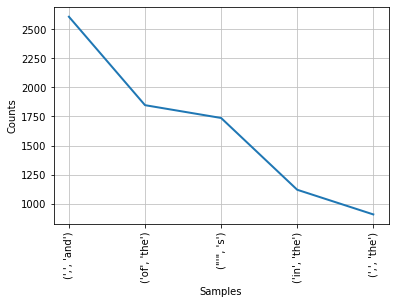

In [4]:
fdist.plot(5);

## Filtrando bi-gramas
Los bi-gramas mas comunes no representan realmente frases o estructuras lexicas de interes, debemos aplicar filtros para mejorarlo

In [5]:
#Con un list comprehension recorremos moby_dick_bigrams que contiene todos los bigramas del libro
#y filtramos, guardando solo aquellos donde ambas palabras tienen mas de 2 caracteres, esto eliminaria los bigramas con caracteres especiales
filtered_bigrams = [bigram for bigram in moby_dick_bigrams if len(bigram[0]) > 2 and len(bigram[1]) > 2 ]
filtered_bigrams[:10]

[('Moby', 'Dick'),
 ('Herman', 'Melville'),
 ('Melville', '1851'),
 ('Late', 'Consumptive'),
 ('Consumptive', 'Usher'),
 ('Grammar', 'School'),
 ('The', 'pale'),
 ('pale', 'Usher'),
 ('and', 'brain'),
 ('see', 'him')]

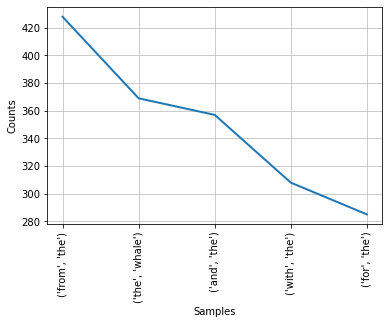

In [6]:
#Creamos una nueva distribucion con los bigramas filtrados
filtered_bigram_dist = FreqDist(filtered_bigrams)
filtered_bigram_dist.plot(5);

## Tri-gramas

In [7]:
from nltk.util import ngrams #metodo que te permite elegir la cantidad de palabras en el ngrama

In [8]:
moby_dick_trigrams = list(ngrams(text1,3)) #el 3 representa la cantidad de palabras en el n-grama
moby_dick_trigrams[:10]

[('[', 'Moby', 'Dick'),
 ('Moby', 'Dick', 'by'),
 ('Dick', 'by', 'Herman'),
 ('by', 'Herman', 'Melville'),
 ('Herman', 'Melville', '1851'),
 ('Melville', '1851', ']'),
 ('1851', ']', 'ETYMOLOGY'),
 (']', 'ETYMOLOGY', '.'),
 ('ETYMOLOGY', '.', '('),
 ('.', '(', 'Supplied')]

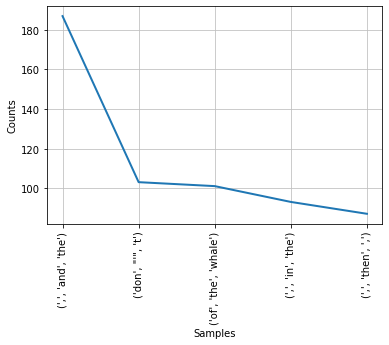

In [9]:
#Extraemos las mayores frecuencias de trigramas
fdist = FreqDist(moby_dick_trigrams)
fdist.plot(5);

## Filtrado de tri-gramas

In [10]:
#Filtramos los trigramas
filtered_trigrams = [tupla for tupla in moby_dick_trigrams if len(tupla[0]) > 2 and len(tupla[1]) > 2 and len(tupla[2]) > 2]
filtered_trigrams[:10]

[('Herman', 'Melville', '1851'),
 ('Late', 'Consumptive', 'Usher'),
 ('The', 'pale', 'Usher'),
 ('see', 'him', 'now'),
 ('was', 'ever', 'dusting'),
 ('ever', 'dusting', 'his'),
 ('dusting', 'his', 'old'),
 ('his', 'old', 'lexicons'),
 ('old', 'lexicons', 'and'),
 ('lexicons', 'and', 'grammars')]

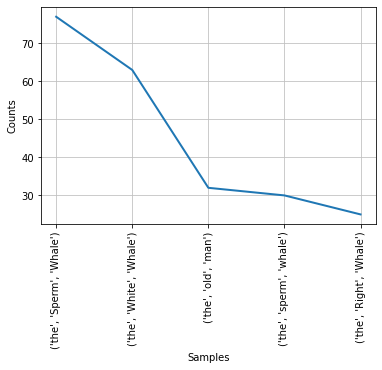

In [11]:
#Calculamos la frecuencia de trigramas filtrado
filtered_dist = FreqDist(filtered_trigrams)
filtered_dist.plot(5);

## Identificando colocaciones del lenguaje

In [12]:
filtered_bigrams[:3]

[('Moby', 'Dick'), ('Herman', 'Melville'), ('Melville', '1851')]

In [13]:
filtered_dist

FreqDist({('the', 'Sperm', 'Whale'): 77, ('the', 'White', 'Whale'): 63, ('the', 'old', 'man'): 32, ('the', 'sperm', 'whale'): 30, ('the', 'Right', 'Whale'): 25, ('the', 'same', 'time'): 24, ('for', 'the', 'time'): 24, ('must', 'have', 'been'): 23, ('into', 'the', 'sea'): 21, ('now', 'and', 'then'): 20, ...})

In [14]:
#Creamos un df con los bigramas

df = pd.DataFrame()
df["bi_grams"] = list(set(filtered_bigrams)) #Creamos una columna con un bi-grama en cada fila
df["word_0"] = df["bi_grams"].apply(lambda x: x[0]) #Creamos una columna por cada palabra del bi-grama
df["word_1"] = df["bi_grams"].apply(lambda x: x[1])
df.head()

,bi_grams,word_0,word_1
0,"(dented, with)",dented,with
1,"(scientific, account)",scientific,account
2,"(wide, ocean)",wide,ocean
3,"(among, other)",among,other
4,"(now, soft)",now,soft


## Métrica Pointwise Mutual Information (PMI)

In [15]:
#Lista de palabras con mas de 2 caracteres en el texto
filtered_words = [word for word in text1 if len(word) > 2]

#Distribucion de las palabras con mas de 2 caracteres en el texto
filtered_words_dist = FreqDist(filtered_words)

#Lo añadimos al df
df["bi_gram_freq"] = df["bi_grams"].apply(lambda x: filtered_bigram_dist[x]) #Columna con frecuencia del bigrama
df["word_0_freq"] = df["word_0"].apply(lambda x: filtered_words_dist[x]) #columna con frecuencia de la palabra 0
df["word_1_freq"] =df["word_1"].apply(lambda x: filtered_words_dist[x]) #columna con frecuencia de la palabra 1

df.head()

,bi_grams,word_0,word_1,bi_gram_freq,word_0_freq,word_1_freq
0,"(dented, with)",dented,with,1,4,1659
1,"(scientific, account)",scientific,account,1,16,32
2,"(wide, ocean)",wide,ocean,1,50,71
3,"(among, other)",among,other,2,158,412
4,"(now, soft)",now,soft,1,646,31


__Comentarios:__ con el df anterior podemos sacar el PMI

In [16]:
#Nueva columna para alojar la metrica de PMI
df["PMI"] = df[["bi_gram_freq", "word_0_freq", "word_1_freq"]].apply(lambda x : np.log2(x.values[0]/(x.values[1]*x.values[2])), axis = 1)
#x representa los 3 valores de las columnas seleccionadas, para seleccionar alguno en especifico se usa .values[indice]

In [17]:
df.head()

,bi_grams,word_0,word_1,bi_gram_freq,word_0_freq,word_1_freq,PMI
0,"(dented, with)",dented,with,1,4,1659,-12.696098
1,"(scientific, account)",scientific,account,1,16,32,-9.000000
2,"(wide, ocean)",wide,ocean,1,50,71,-11.793603
3,"(among, other)",among,other,2,158,412,-14.990281
4,"(now, soft)",now,soft,1,646,31,-14.289587


In [18]:
df.sort_values(by= "PMI", ascending = False)

,bi_grams,word_0,word_1,bi_gram_freq,word_0_freq,word_1_freq,PMI
16178,"(idolatrous, dotings)",idolatrous,dotings,1,1,1,0.000000
6626,"(Stealing, unawares)",Stealing,unawares,1,1,1,0.000000
26696,"(TWISTED, OAKUM)",TWISTED,OAKUM,1,1,1,0.000000
63222,"(worldly, ties)",worldly,ties,1,1,1,0.000000
45837,"(thunderous, concussion)",thunderous,concussion,1,1,1,0.000000
...,...,...,...,...,...,...,...
25828,"(man, the)",man,the,1,508,13721,-22.732783
37144,"(some, the)",some,the,1,578,13721,-22.919024
64532,"(one, the)",one,the,1,889,13721,-23.540138
50152,"(the, not)",the,not,1,13721,1103,-23.851315


__Comentarios:__ Podriamos estar tentados a decir que los primeros valores con un PMI=0 son colocaciones importantes, sin embargo observamos que la frecuencia tanto de los bigramas como de cada parabra es igual a 1, debemos encontrar bigramas que tengan mayor frecuencia en el texto y PMI cercano a 0

## Grafico de frecuencia y PMI de los bigramas

In [19]:
#Generamos una nueva columna con el logaritmo de la columna de la frecuencia del bigrama
#Esto lo hacemos porque el PMI es resultado de un logaritmo y se deben igualar las escalas para que el grafico no se vea distorsionado
df["log(bi_gram_freq)"] = df["bi_gram_freq"].apply(lambda x: np.log2(x))
df.head()

,bi_grams,word_0,word_1,bi_gram_freq,word_0_freq,word_1_freq,PMI,log(bi_gram_freq)
0,"(dented, with)",dented,with,1,4,1659,-12.696098,0.0
1,"(scientific, account)",scientific,account,1,16,32,-9.000000,0.0
2,"(wide, ocean)",wide,ocean,1,50,71,-11.793603,0.0
3,"(among, other)",among,other,2,158,412,-14.990281,1.0
4,"(now, soft)",now,soft,1,646,31,-14.289587,0.0


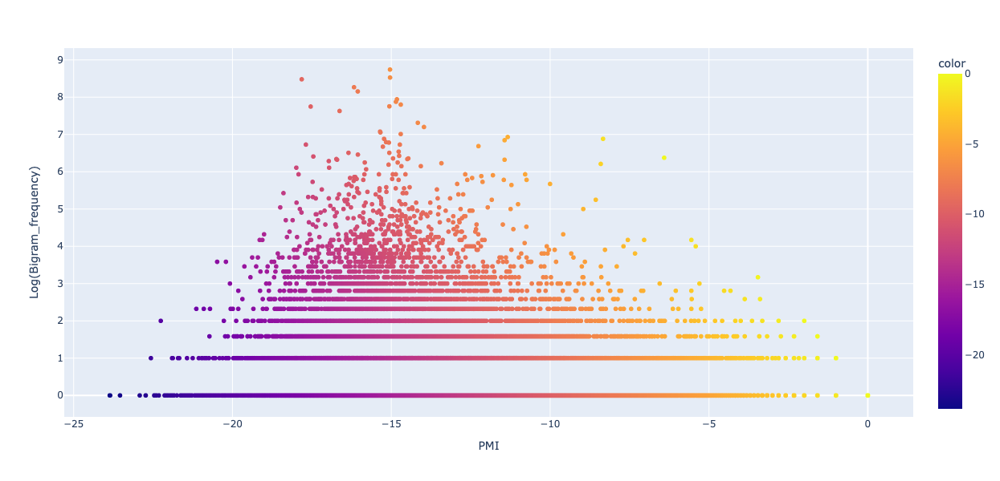

In [20]:
#Grafico interactivo

px.scatter(x= df["PMI"], y= df["log(bi_gram_freq)"], #Datos a graficar
           color = df["PMI"] + df["log(bi_gram_freq)"], #Color del grafico, le indicamos que sea la suma de las dos variables
           hover_name = df["bi_grams"], #¿Que queremos que aparezca cuando nos ubicamos sobre un punto?, en este caso el nombre del bigrama
          width = 600, height = 600, #Tamaño del grafico
           labels = {"x" : "PMI", "y" : "Log(Bigram_frequency)"}, #Etiquetas de los ejes
          )

__Comentarios:__ Las colocaciones importantes son aquellas cuya frecuencia es alta y PMI bajo, por ejemplo "Sperm whale", "Moby dick", "White whale" que se ubican entre -10 y -5  PMI y el rango 6 y 7 frecuencia

## Filtros y colocaciones en NLTK
Haremos el proceso anterior de una manera mas automatica sin necesidad de graficar

In [21]:
from nltk.collocations import * #Importamos todas las funciones de colocaciones

In [22]:
#Metrica PMI
bigram_measure = nltk.collocations.BigramAssocMeasures() #Modulo de nltk que permite calcular metricas, incluyendo PMI
finder = BigramCollocationFinder.from_words(text1) #Metodo que permite encontrar las colocaciones en base a las palabras del texto

In [23]:
#Hacemos un preprocesamiento de las colocaciones
finder.apply_freq_filter(20) #Usamos un filtro de frecuencia, se quedara con los bigramas que tengan una frecuencia mayor al numero indicado
finder.nbest(bigram_measure.pmi,10) #Retornara las mejores colocaciones en base a una metrica, la cual indicamos con el objeto creado anteriormente con 
                                    # BigramAssocMeasures() mas la metrica y debemos indicarle cuantas colocaciones retornará, en este caso serian 10

[('Moby', 'Dick'),
 ('Sperm', 'Whale'),
 ('White', 'Whale'),
 ('Right', 'Whale'),
 ('Captain', 'Peleg'),
 (',"', 'said'),
 ('never', 'mind'),
 ('!"', 'cried'),
 ('no', 'means'),
 ('each', 'other')]

# Nueva practica con textos en español

In [24]:
nltk.download("cess_esp") #Descargamos la lista de titulares en español
corpus = nltk.corpus.cess_esp.sents() #Creamos el corpus con las frases
corpus

[nltk_data] Downloading package cess_esp to
[nltk_data]     /Users/macbookair/nltk_data...
[nltk_data]   Package cess_esp is already up-to-date!


[['El', 'grupo', 'estatal', 'Electricité_de_France', '-Fpa-', 'EDF', '-Fpt-', 'anunció', 'hoy', ',', 'jueves', ',', 'la', 'compra', 'del', '51_por_ciento', 'de', 'la', 'empresa', 'mexicana', 'Electricidad_Águila_de_Altamira', '-Fpa-', 'EAA', '-Fpt-', ',', 'creada', 'por', 'el', 'japonés', 'Mitsubishi_Corporation', 'para', 'poner_en_marcha', 'una', 'central', 'de', 'gas', 'de', '495', 'megavatios', '.'], ['Una', 'portavoz', 'de', 'EDF', 'explicó', 'a', 'EFE', 'que', 'el', 'proyecto', 'para', 'la', 'construcción', 'de', 'Altamira_2', ',', 'al', 'norte', 'de', 'Tampico', ',', 'prevé', 'la', 'utilización', 'de', 'gas', 'natural', 'como', 'combustible', 'principal', 'en', 'una', 'central', 'de', 'ciclo', 'combinado', 'que', 'debe', 'empezar', 'a', 'funcionar', 'en', 'mayo_del_2002', '.'], ...]

In [25]:
#Hacemos una lista plana con un list comprehensions

flatten_corpus = [word for titular in corpus for word in titular]
print(flatten_corpus[:50])

['El', 'grupo', 'estatal', 'Electricité_de_France', '-Fpa-', 'EDF', '-Fpt-', 'anunció', 'hoy', ',', 'jueves', ',', 'la', 'compra', 'del', '51_por_ciento', 'de', 'la', 'empresa', 'mexicana', 'Electricidad_Águila_de_Altamira', '-Fpa-', 'EAA', '-Fpt-', ',', 'creada', 'por', 'el', 'japonés', 'Mitsubishi_Corporation', 'para', 'poner_en_marcha', 'una', 'central', 'de', 'gas', 'de', '495', 'megavatios', '.', 'Una', 'portavoz', 'de', 'EDF', 'explicó', 'a', 'EFE', 'que', 'el', 'proyecto']


In [26]:
#Modulo de nltk que permite calcular metricas, incluyendo PMI
bigram_measure = nltk.collocations.BigramAssocMeasures() 

#Creamos el finder que permite encontrar las colocaciones en base a las palabras del texto
finder = BigramCollocationFinder.from_documents(corpus) #En este caso usamos from_documents por el tipo de estructura de los datos
finder.apply_freq_filter(10)
finder.nbest(bigram_measure.pmi,10)

[('señora', 'Aguirre'),
 ('secretario', 'general'),
 ('elecciones', 'generales'),
 ('campaña', 'electoral'),
 ('quiere', 'decir'),
 ('Se', 'trata'),
 ('segunda', 'vuelta'),
 ('director', 'general'),
 ('primer', 'ministro'),
 ('primer', 'lugar')]

__Comentarios:__ De todas las anteriores podemos identificar como colocacion el bigrama "campaña electoral", "segunda vuelta", ya que estas palabras por separado significan cosas distintas a lo que expresan en conjunto